<a href="https://www.kaggle.com/code/waseemnagahhenes/braintumor-detection-with-acc-95?scriptVersionId=123382508" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Set Up Environment

## Install Needed Libraries

In [1]:
# install some libraries
!pip install -U tensorflow==2.9.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 57.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 78.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 37.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 82.8 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.11.0
    Uninstalling keras-2.11.0:
      Successfully uninstalled keras-2.11.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.1.21
    Uninstalling flatbuffers-23.1.21:
      Successfully uninstalled flatbuffers-23.1.21
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.11.0
    Uninstalling tensorflow-estimator-2.11.0:
      Successfully uninstalled tensorflo

## Import Packages

In [2]:
import random
import os
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
import cv2


import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from PIL import Image

import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_fscore_support
from sklearn.metrics import accuracy_score, top_k_accuracy_score, f1_score, matthews_corrcoef
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scikitplot.metrics import plot_roc
from torchvision.io import read_image, ImageReadMode

## Define the Hyperparameters

In [3]:
EPOCHS = 20
BATCH_SIZE = 32
SEED = 42
TF_SEED = 768
CHANNELS = 3
IMAGE_SIZE = 224

# Load the Dataset

In [4]:
# Define paths
DATASET_PATH = "/kaggle/input/brain-tumor-for-14-classes/BrainTumor"

## Read The Dataset

In [5]:
# Read the dataset using directory
directory = tf.keras.preprocessing.image_dataset_from_directory(
    "/kaggle/input/brain-tumor-for-14-classes/BrainTumor",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 4455 files belonging to 15 classes.


## Save the dataset in DataFrame

In [6]:
# get a list of all the directories inside the brain directory
class_dirs = os.listdir(DATASET_PATH)

# create empty lists to store the image names and class names
image_names = []
class_names = []

# iterate over each class directory
for class_dir in class_dirs:
    # get the path to the current class directory
    class_path = os.path.join(DATASET_PATH, class_dir)
    
    # iterate over each image file inside the current class directory
    for image_file in os.listdir(class_path):
        # get the path to the current image file
        image_path = os.path.join(class_path, image_file)
        
        # open the image using PIL
        image = Image.open(image_path)
        
        # append the image name and class name to their respective lists
        image_names.append(os.path.join(class_dir, image_file))
        class_names.append(class_dir)
        
# create a dataframe with two columns: image name and class name
df = pd.DataFrame({'image_name': image_names, 'class_name': class_names}).sample(frac = 1, random_state=73)

In [7]:
# Display the dataframe of dataset
df

,image_name,class_name
1555,Astrocitoma/3f973d50f0905577f557158b298419_big...,Astrocitoma
3792,Meningioma/2022-05-30 15_42_05-Atypical mening...,Meningioma
1865,Normal/5b517553a56210cd6791c95420bccb_big_gall...,Normal
3331,Meningioma/61a1f14e76d0b3556d359a0de38242_big_...,Meningioma
3250,Meningioma/0534d99005f8264c6a7bf740239d99_big_...,Meningioma
...,...,...
321,Schwannoma/d616cbe6047d8917d4ba0b8d527615d83b2...,Schwannoma
4419,Ganglioglioma/bfb29575257618fc0e663524407609_b...,Ganglioglioma
394,Schwannoma/274d0c86443aee432cb9385ddc0241_big_...,Schwannoma
4014,Carcinoma/147._big_gallery.jpeg,Carcinoma


## Load class names

In [8]:
# get class names associated with dataset images
categories = directory.class_names
print(categories)

['Astrocitoma', 'Carcinoma', 'Ependimoma', 'Ganglioglioma', 'Germinoma', 'Glioblastoma', 'Granuloma', 'Meduloblastoma', 'Meningioma', 'Neurocitoma', 'Normal', 'Oligodendroglioma', 'Papiloma', 'Schwannoma', 'Tuberculoma']


# Exploratory Data Analysis

## Summary of the dataset

In [9]:
# Generate a summary of the dataset
print('DATASET SUMMARY')
print('========================\n')
for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")
print('\n========================')

DATASET SUMMARY

There are 15 directories and 0 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor
There are 0 directories and 145 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Tuberculoma
There are 0 directories and 465 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Schwannoma
There are 0 directories and 457 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Neurocitoma
There are 0 directories and 580 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Astrocitoma
There are 0 directories and 204 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Glioblastoma
There are 0 directories and 522 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Normal
There are 0 directories and 237 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Papiloma
There are 0 directories and 150 images in /kaggle/input/brain-tumor-for-14-classes/BrainTumor/Ependimoma
There are 0 directories and 131 images in /kaggle/i

## Identify the Images properties variation

In [10]:
# initialze an empty dictionary to carry the size of each image
size_data = {}
for i in categories:
    path = os.path.join('/kaggle/input/brain-tumor-for-14-classes/BrainTumor', i)
    class_num = categories.index(i)
    temp_dict = {}

    # iterate over the images in the dataset
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        img = cv2.imread(filepath)
        Original_image_Size = np.shape(img)
        if len(Original_image_Size) > 2:
          
          # get height, width and channels for each image
            height, width, channels = cv2.imread(filepath).shape
            if str(height) + ' x ' + str(width) in temp_dict:
                temp_dict[str(height) + ' x ' + str(width)] += 1 
            else:
                temp_dict[str(height) + ' x ' + str(width)] = 1
                
    size_data[i] = temp_dict

## Display the Number of images associated with each class

In [11]:
# get the total number of images on each class
number = {}
for i, name in enumerate(categories):
  number[name] = sum(size_data[name].values())
courses = list(number.keys())
values = list(number.values())
print(number)

{'Astrocitoma': 580, 'Carcinoma': 251, 'Ependimoma': 150, 'Ganglioglioma': 38, 'Germinoma': 100, 'Glioblastoma': 204, 'Granuloma': 78, 'Meduloblastoma': 131, 'Meningioma': 874, 'Neurocitoma': 457, 'Normal': 522, 'Oligodendroglioma': 224, 'Papiloma': 237, 'Schwannoma': 465, 'Tuberculoma': 145}


## Display the difference of values between each class
### 

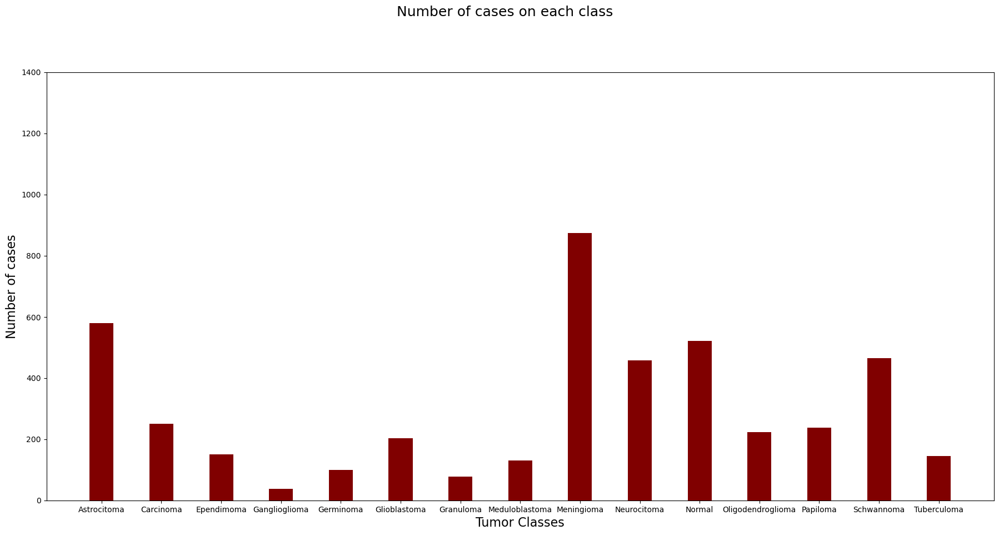

In [12]:
# define the bars colors
c = ['blue']
# define the figure size
plt.rcParams["figure.figsize"] = (22,10)
# make the barchart
plt.bar(courses, values, color ='maroon',
        width = 0.4)
# set the title and labels 
plt.suptitle('Number of cases on each class', y=1, fontsize=18)
plt.xlabel('Tumor Classes', fontsize=16)
plt.ylabel('Number of cases', fontsize=16)
# set y-axis limit
plt.ylim([0, 1400])
plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.


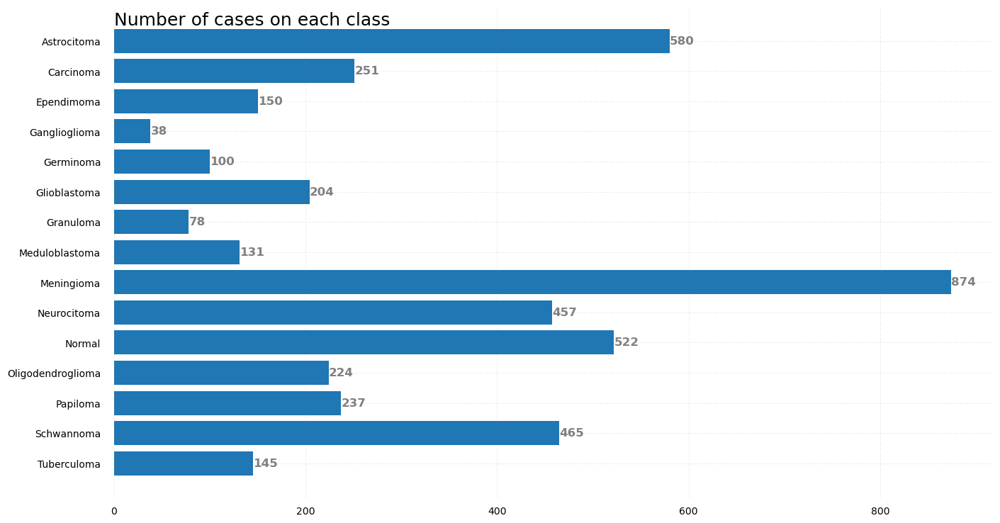

In [13]:
 # Figure Size
fig, ax = plt.subplots(figsize =(16, 9))
 
# Horizontal Bar Plot
ax.barh(courses, values)
 
# Remove axes splines
for s in ['top', 'bottom', 'left', 'right']:
    ax.spines[s].set_visible(False)
 
# Remove x, y Ticks
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')
 
# Add padding between axes and labels
ax.xaxis.set_tick_params(pad = 5)
ax.yaxis.set_tick_params(pad = 10)
 
# Add x, y gridlines
ax.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)
 
# Show top values
ax.invert_yaxis()
 
# Add annotation to bars
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 12, fontweight ='bold',
             color ='grey')
 
# Add Plot Title
ax.set_title('Number of cases on each class', y=0.95, fontsize=18,
             loc ='left')
 
# Show Plot
plt.show()

## Dataset images Visualization 

### Display some random images

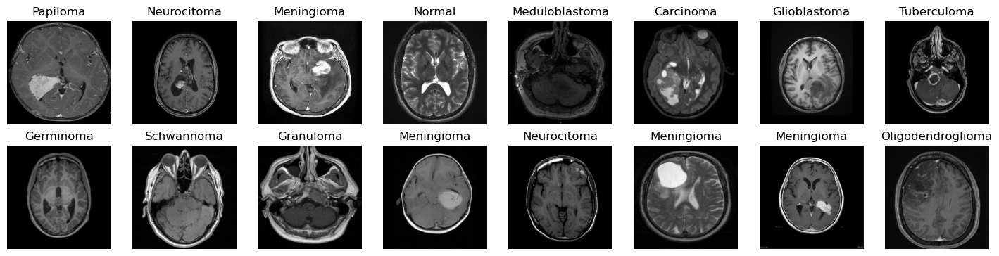

In [14]:
# define the figure size
plt.figure(figsize=(18, 18))
# iterate over the images in the shuffled dataset and take a sample consists of 16 images with their corresponding labels
for image_batch, labels_batch in directory.take(1):
    for i in range(16):
        ax = plt.subplot(8, 8, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(categories[labels_batch[i]])
        plt.axis("off")

### Display a sample image in each class

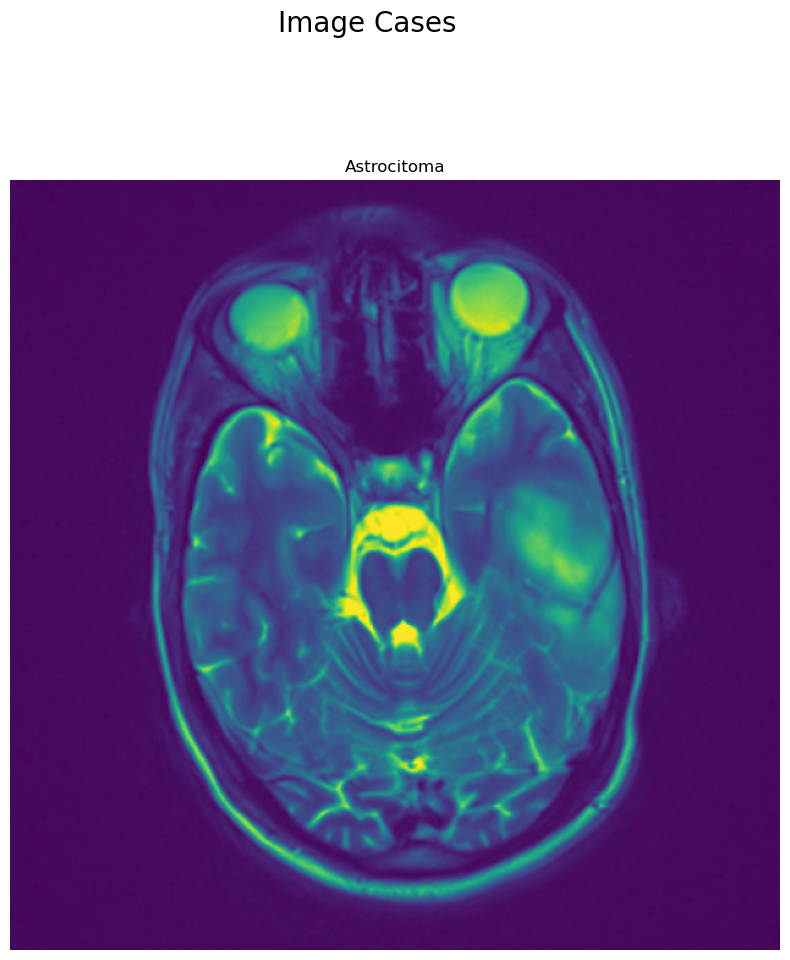

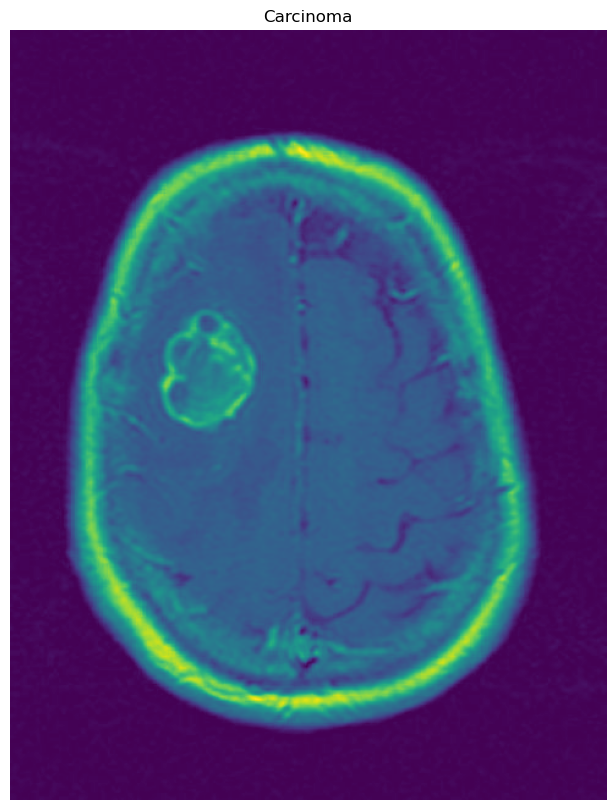

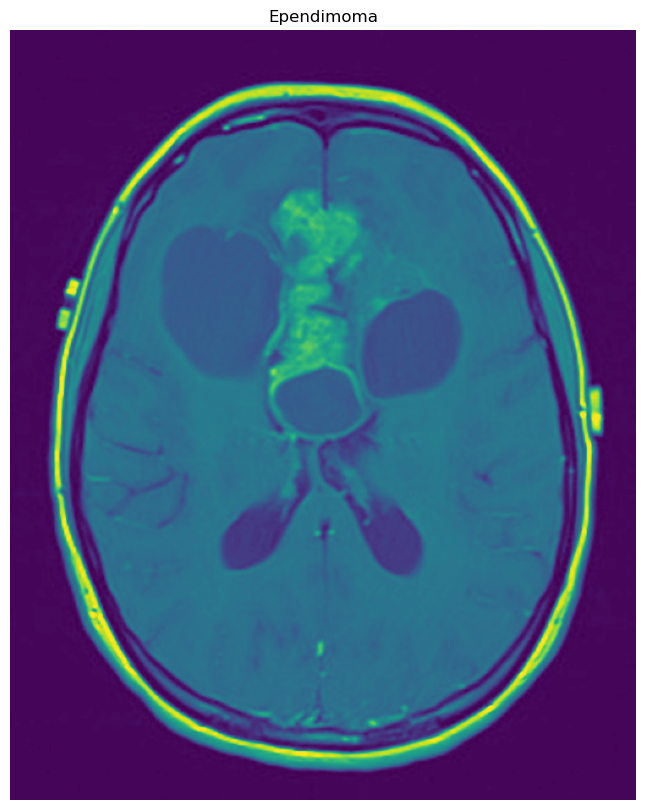

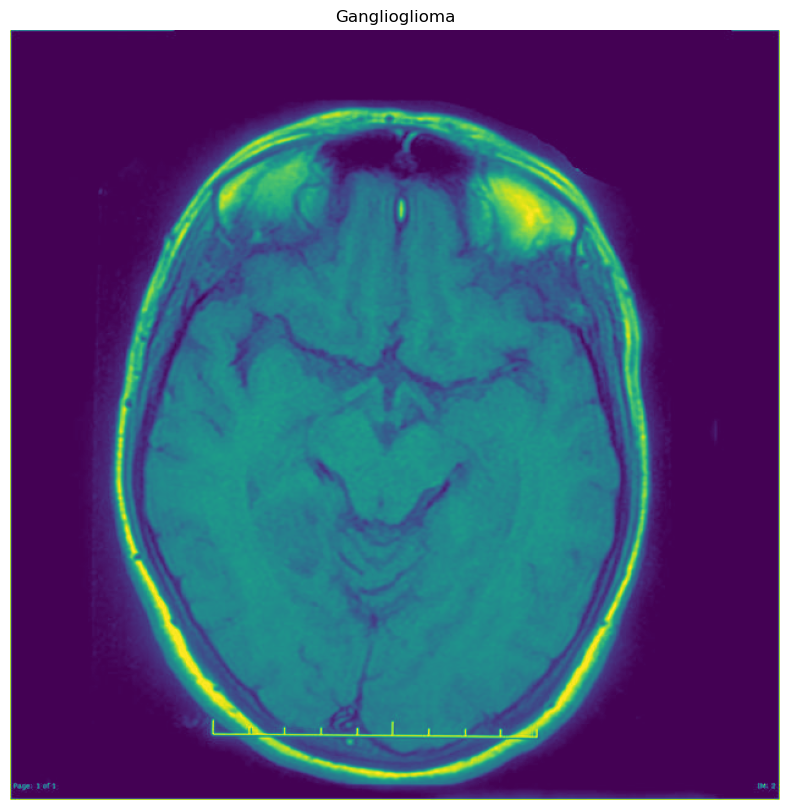

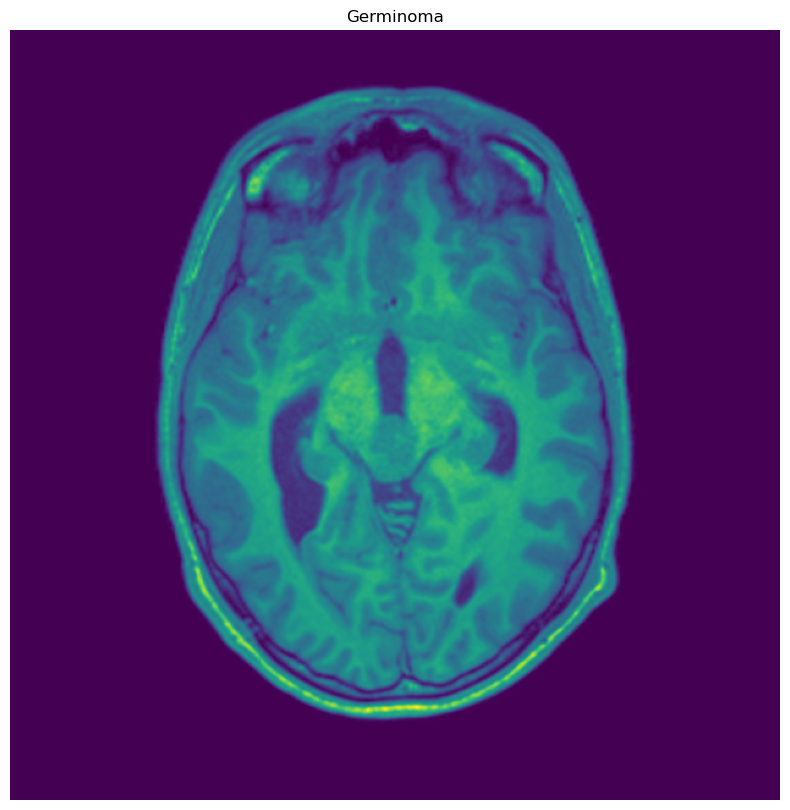

...

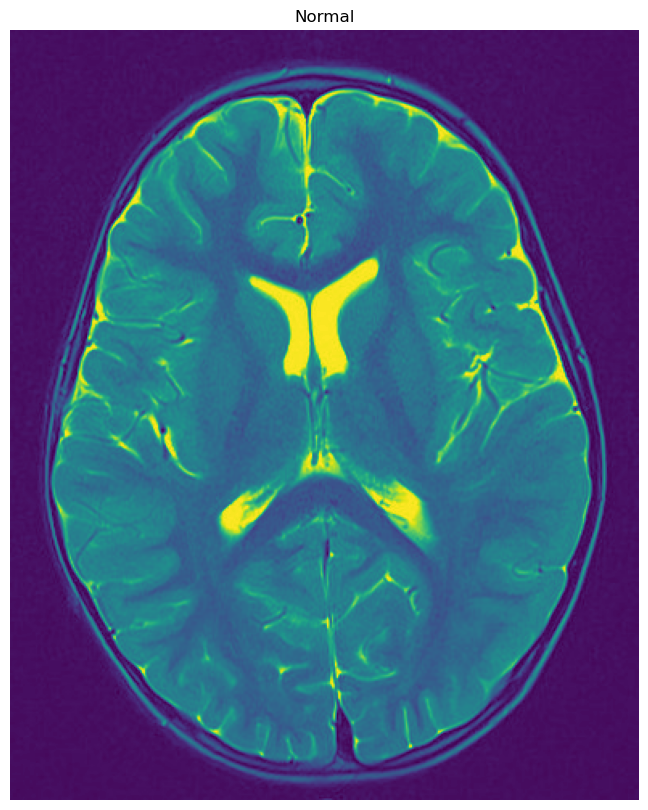

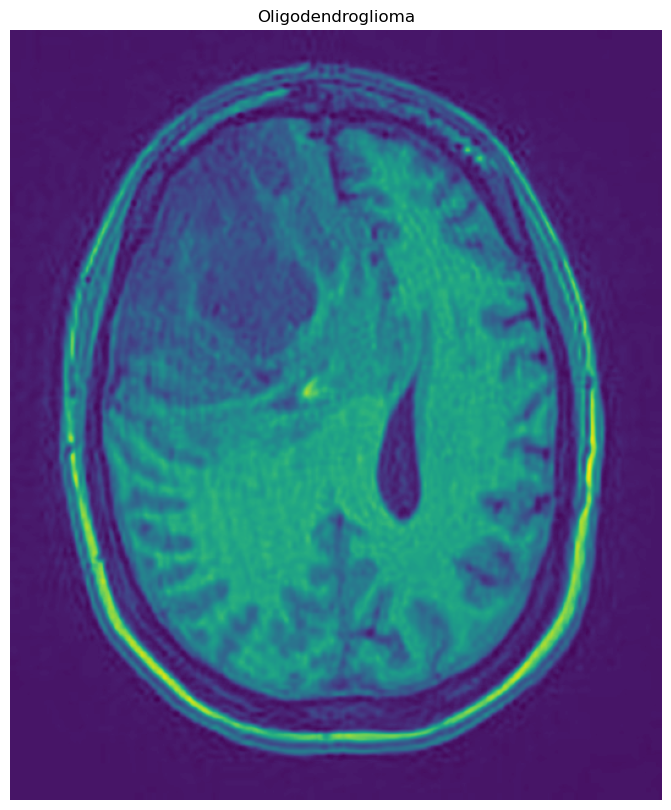

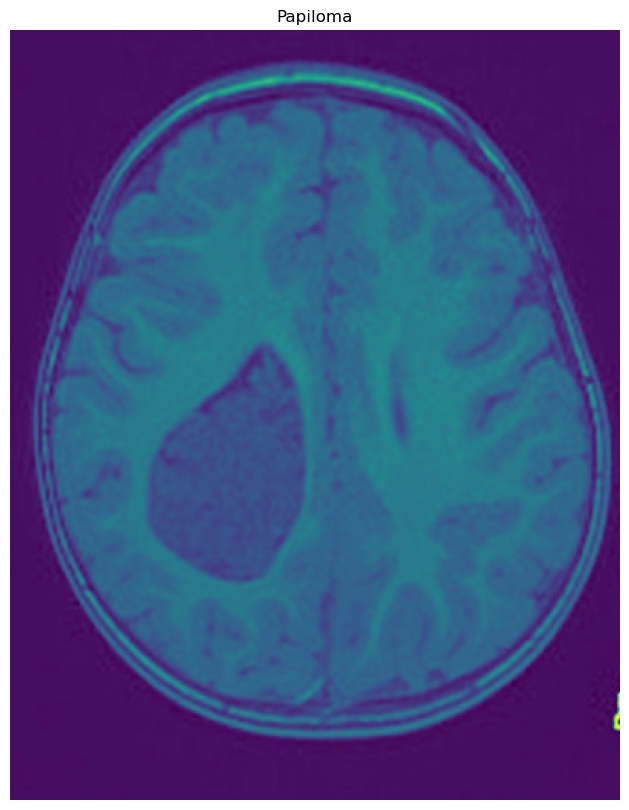

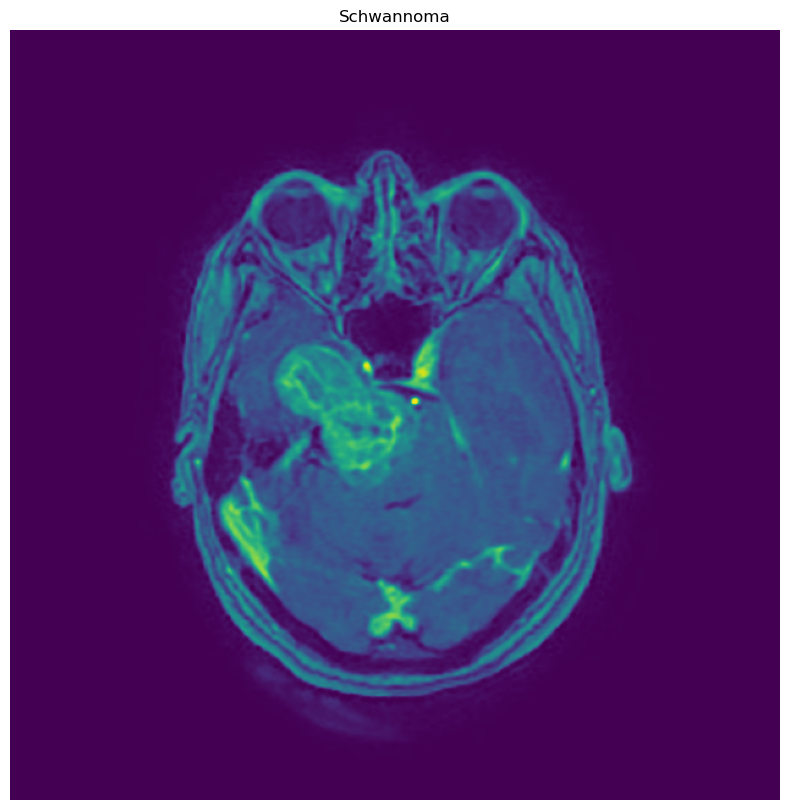

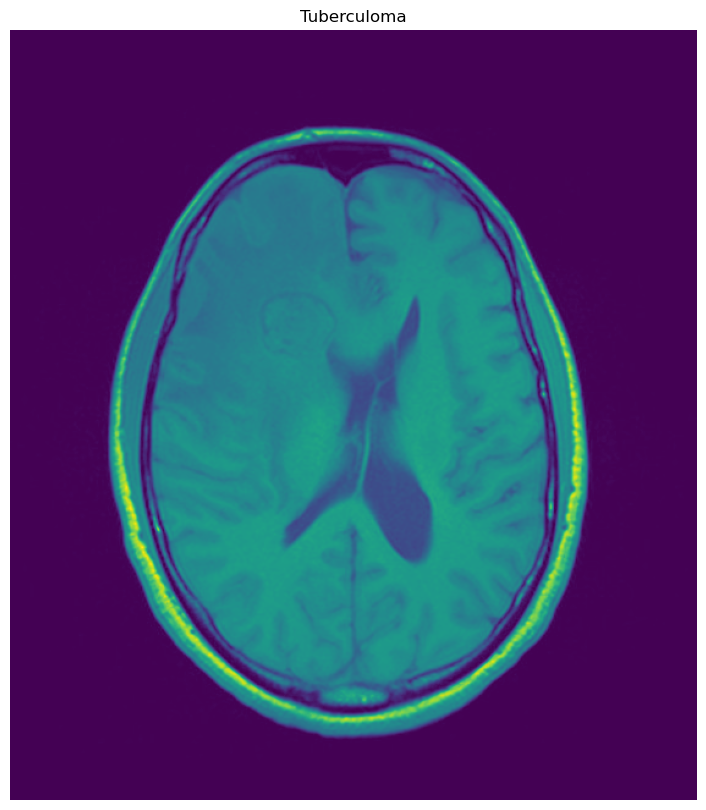

In [15]:
# show a sample from each class of images
plt.suptitle('Image Cases', y=1.05, fontsize=20)
for i in categories:
    path = os.path.join('/kaggle/input/brain-tumor-for-14-classes/BrainTumor', i)
    class_num = categories.index(i)
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        img = cv2.imread(filepath, 0)
        
        plt.imshow(img)
        plt.axis("off")
        plt.title(i)
        plt.show()
        break

# Pre-Processing the data

## Dataset Partitioning

In [16]:
# split the data to train and test
train_d, test_df = train_test_split(df, train_size=0.9, random_state=0)
# split the train data to train and validation
train_df, val_df = train_test_split(train_d, train_size=0.9, random_state=0)

In [17]:
# Display how many images for training and validation and testing
print(f"values of each class in train data: {train_df['class_name'].value_counts()}")
print(f"values of each class in validation data: {val_df['class_name'].value_counts()}")
print(f"values of each class in test data: {test_df['class_name'].value_counts()}")

values of each class in train data: Meningioma           700
Astrocitoma          490
Normal               419
Schwannoma           372
Neurocitoma          360
Carcinoma            203
Papiloma             192
Oligodendroglioma    182
Glioblastoma         167
Ependimoma           125
Tuberculoma          119
Meduloblastoma        99
Germinoma             86
Granuloma             65
Ganglioglioma         30
Name: class_name, dtype: int64
values of each class in validation data: Meningioma           72
Schwannoma           48
Astrocitoma          44
Normal               43
Neurocitoma          35
Carcinoma            29
Papiloma             25
Glioblastoma         24
Oligodendroglioma    23
Meduloblastoma       20
Tuberculoma          14
Germinoma             8
Ependimoma            7
Granuloma             6
Ganglioglioma         3
Name: class_name, dtype: int64
values of each class in test data: Meningioma           102
Neurocitoma           62
Normal                60
Astrocitoma     

## Data Augmentation
Data augmentation is a technique to artificially create new training data from existing training data. This is done by applying domain-specific techniques to examples from the training data that create new and different training examples.

In [18]:
from tensorflow.keras.layers import concatenate
def data_Augmentation(train_df, val_df, test_df):
    # create ImageDataGenerator object
    train_gen = ImageDataGenerator(rescale = 1./255,
                                    rotation_range = 20, # randomly rotate images by up to 20 degrees
                                    width_shift_range = 0.1, # randomly shift images horizontally by up to 10%
                                    height_shift_range = 0.1, # randomly shift images vertically by up to 10%
                                    shear_range = 0.1, # randomly shear images vertically by up to 10%
                                    zoom_range = 0.1, # randomly zoom in on images by up to 10%
                                    horizontal_flip = True, # randomly flip images horizontally
                                    vertical_flip =True, # randomly flip images vertically
                                    fill_mode='nearest')  # fill any empty pixels with the nearest neighbor value

    # test images will be rescaled by 1./255
    test_gen = ImageDataGenerator(rescale = 1./255)

    train_gen = train_gen.flow_from_dataframe(dataframe = train_df, 
                                                directory=DATASET_PATH, # This is the source directory for training images
                                                x_col='image_name',
                                                y_col='class_name',
                                                class_mode='categorical',
                                                target_size=(IMAGE_SIZE,IMAGE_SIZE),# All images will be resized to 224x224
                                                batch_size=BATCH_SIZE)
    

    valid_gen = test_gen.flow_from_dataframe(dataframe = val_df, 
                                                directory=DATASET_PATH, # This is the source directory for training images
                                                x_col='image_name',
                                                y_col='class_name',
                                                class_mode='categorical',
                                                target_size=(IMAGE_SIZE,IMAGE_SIZE),  # All images will be resized to 224x224
                                                batch_size=BATCH_SIZE)
        
    test_gen = test_gen.flow_from_dataframe(dataframe = test_df, 
                                                directory=DATASET_PATH, # This is the source directory for training images
                                                x_col='image_name',
                                                y_col='class_name',
                                                class_mode='categorical',
                                                target_size=(IMAGE_SIZE,IMAGE_SIZE),  # All images will be resized to 224x224
                                                batch_size=BATCH_SIZE)

    return train_gen, valid_gen, test_gen

In [19]:
train_gen, valid_gen, test_gen = data_Augmentation(train_df, val_df, test_df)

/opt/conda/lib/python3.7/site-packages/keras/preprocessing/image.py:991: UserWarning: Found 1 invalid image filename(s) in x_col="image_name". These filename(s) will be ignored.
  n_invalid, x_col))


Found 3608 validated image filenames belonging to 15 classes.
Found 401 validated image filenames belonging to 15 classes.
Found 446 validated image filenames belonging to 15 classes.


## Dataset Partitioning and shuffling and Autotune to the dataset

In [20]:
# Split and Shuffle The data, Autotune to the dataset
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    ds_size = len(ds)

    # Shuffle the data
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    # split the data
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    # Autotune the dataset 
    train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
    val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
    test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
    return train_ds, val_ds, test_ds

# call the function to return train data, validation data, test data
train_ds, val_ds, test_ds = get_dataset_partitions_tf(directory)

## Display some of the images that have been augmented

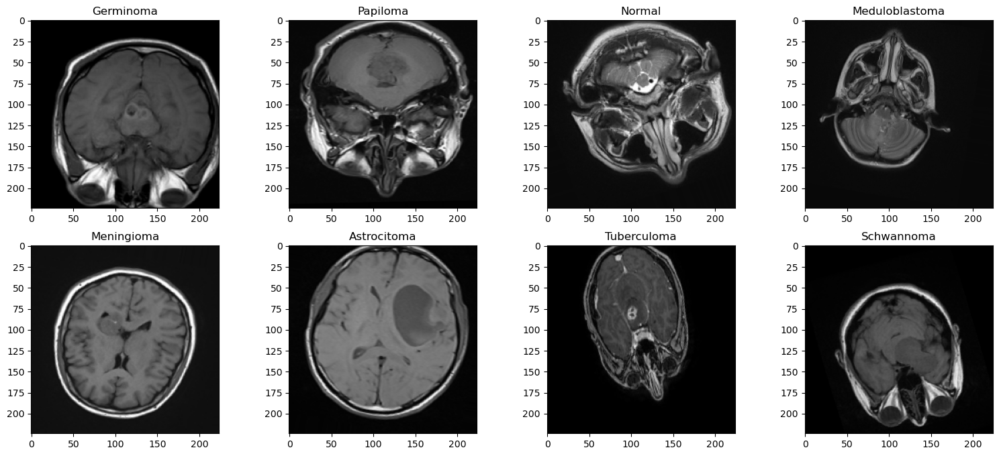

In [21]:
# Steps to plot the images
imgs,labels = next(train_gen)
figsize=(19, 8)
columns = 4
rows = 2
fig, ax = plt.subplots(nrows=rows, ncols=columns, figsize=figsize)

for i, axi in enumerate(ax.flat):
    image = imgs[i]
    axi.imshow(image)
    axi.set_title(categories[np.argmax(labels[i])])
plt.show()

# ANN architecture

## Define the callbacks
Now complete the callback that will ensure that training will stop after an accuracy of 95% is reached:

In [22]:
# create the callback
class myCallback(tf.keras.callbacks.Callback):
        # Define the correct function signature for on_epoch_end
        def on_epoch_end(self, epoch, logs={}):
            if (logs.get('accuracy') >= 0.95):
                print("\nReached 95% accuracy so cancelling training!") 
                
                # Stop training once the above condition is met
                self.model.stop_training = True
# Instantiate the callback class
callbacks = myCallback()

## Pre-trained model

In [23]:
ENV = tf.keras.applications.EfficientNetV2S(weights = 'imagenet', 
                 include_top = False, 
                 input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS))

# Here we freeze the layers 
# Layers are set to trainable as True by default
for layer in ENV.layers:
    layer.trainable = False

82420632/82420632 [==============================] - 3s 0us/step


### Get the pre-trained model Summary

In [24]:
# Summary for the Layers of Pre_trained model
ENV.summary()

Model: "efficientnetv2-s"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 24  648         ['rescaling[0][0]']              
                                )                                                                 
                                                                                   

## Define the Architecture

In [25]:
# Create the model achitecture
from keras.models import Model
num_classes = 15
top_model = ENV.output
top_model = tf.keras.layers.GlobalAveragePooling2D()(top_model)
top_model = tf.keras.layers.Dense(256,activation='relu')(top_model)
top_model = tf.keras.layers.Dense(256,activation='relu')(top_model)
top_model = tf.keras.layers.Dense(128,activation='relu')(top_model)
top_model = tf.keras.layers.Dense(num_classes,activation='softmax')(top_model)

model = Model(inputs = ENV.input, outputs = top_model)

## Compiling the model
### The compilation is performed using one single method call called compile.

The compile method requires several parameters. The loss parameter is specified to have type 'sparse_categorical_crossentropy'. The metrics parameter is set to 'accuracy' and finally we use the adam optimizer for training the network.

The output at this stage is shown below −

In [26]:
# create the compiler
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Overview of the Architecture

## Visualize The ANN Architecture
(Layers: Input - Hidden - Output) 

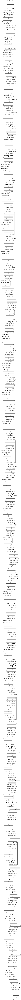

In [27]:
# Visualize the Layers of the Model architecture
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(model, to_file='convnet.png', show_shapes=True,show_layer_names=True)
Image(filename='convnet.png')

# Training Phase

## Train the ANN model
### The model training is done in one single method call called fit that takes few parameters as seen in the code below

The first two parameters to the fit method specify the features and the output of the training dataset.

The epochs is set to 20; we assume that the training will converge in max 20 epochs - the iterations. 

The trained model is validated on the test data as specified in the last parameter.

In [28]:
# train the model using fit
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
    callbacks=[callbacks]
)

Epoch 1/20
112/112 [==============================] - 48s 199ms/step - loss: 1.7315 - accuracy: 0.4566 - val_loss: 1.1916 - val_accuracy: 0.6116
Epoch 2/20
112/112 [==============================] - 10s 91ms/step - loss: 1.1273 - accuracy: 0.6434 - val_loss: 0.8881 - val_accuracy: 0.7366
Epoch 3/20
112/112 [==============================] - 10s 90ms/step - loss: 0.8742 - accuracy: 0.7221 - val_loss: 0.6790 - val_accuracy: 0.8036
Epoch 4/20
112/112 [==============================] - 10s 89ms/step - loss: 0.6989 - accuracy: 0.7822 - val_loss: 0.4819 - val_accuracy: 0.8460
Epoch 5/20
112/112 [==============================] - 10s 91ms/step - loss: 0.6126 - accuracy: 0.7991 - val_loss: 0.3865 - val_accuracy: 0.8772
Epoch 6/20
112/112 [==============================] - 10s 89ms/step - loss: 0.5326 - accuracy: 0.8258 - val_loss: 0.3472 - val_accuracy: 0.9040
Epoch 7/20
112/112 [==============================] - 10s 90ms/step - loss: 0.4239 - accuracy: 0.8609 - val_loss: 0.2788 - val_accuracy

# Visualizing the model Metrics

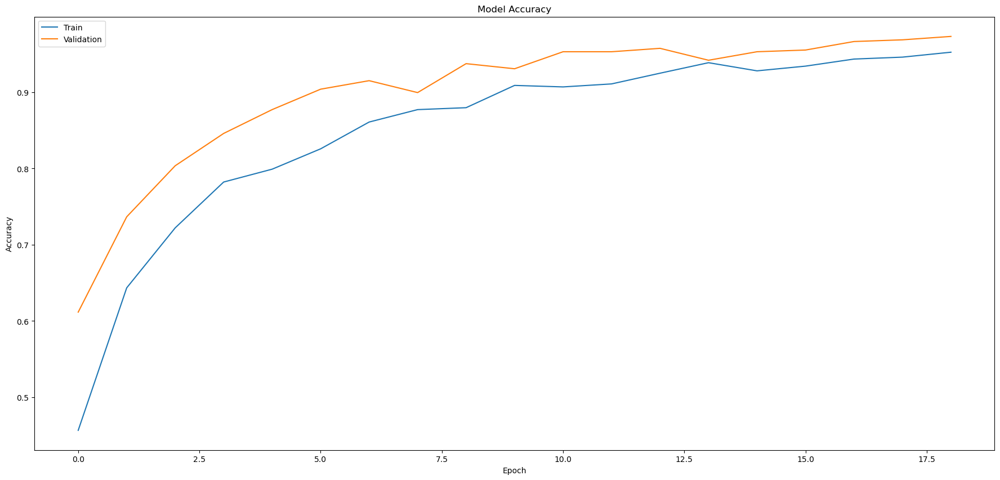

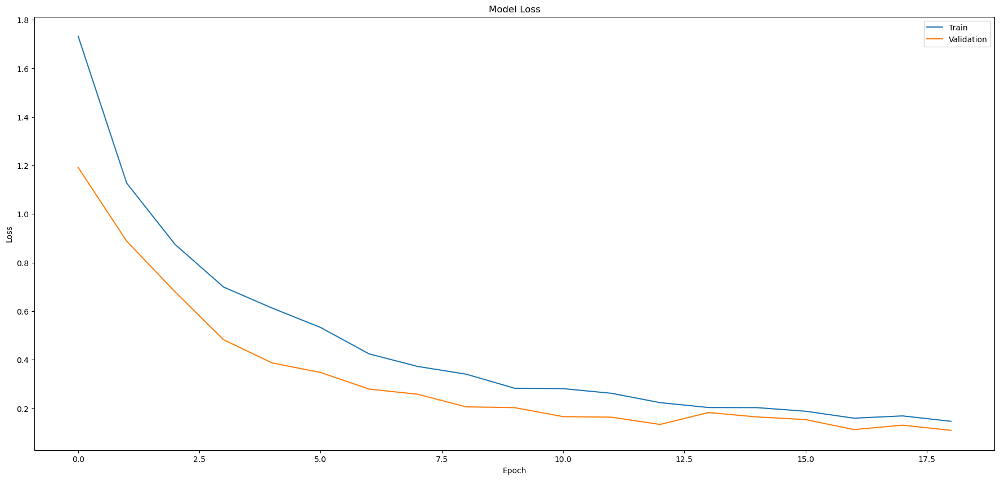

In [29]:
# visualize the model accuracy for the training data and Validation data
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# visualize the model loss for the training data and Validation data
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# Model Evaluation

In [30]:
# model evaluation to know the accuracy
model.evaluate(test_ds)

14/14 [==============================] - 11s 78ms/step - loss: 0.1211 - accuracy: 0.9576


[0.12112105637788773, 0.9575892686843872]

# Save the model

In [31]:
# save the trained model to use
model.save('/kaggle/working/modelENV.h5')

## Save model history

In [32]:
# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history.history) 

# save to json:  
hist_json_file = 'history.json' 
with open(hist_json_file, mode='w') as f:
    hist_df.to_json(f)

# or save to csv: 
hist_csv_file = 'history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

# Testing the model

1/1 [==============================] - 3s 3s/step


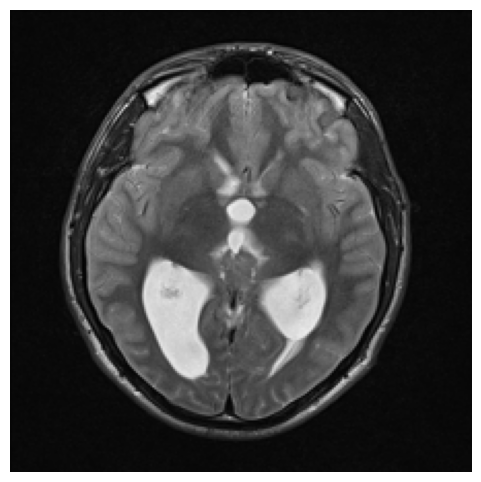

Predicted case -> Germinoma


In [33]:
# Testing the model using sample image
image_path = "/kaggle/input/brain-tumor-for-14-classes/BrainTumor/Germinoma/076a6fa8613c4a4f8b05f4383280b9_big_gallery.jpeg"
image = tf.keras.preprocessing.image.load_img(image_path)
image = image.resize((IMAGE_SIZE,IMAGE_SIZE))
image_array = tf.keras.preprocessing.image.img_to_array(image)
scaled_img = np.expand_dims(image_array, axis=0)
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")

# Use model to predict the sample image
pred = model.predict(scaled_img)

# show the output of predicted image
output = categories[np.argmax(pred)]
plt.show()
print("Predicted case ->", output)